In [1]:
using Plots
using ForwardDiff
using Base.Threads
using LinearAlgebra
using LogExpFunctions, Distances
using WassersteinDictionaries
using Gridap
using Gridap.GridapODEs
using Gridap.FESpaces
using Gridap.CellData
using LineSearches
using Test
using Statistics
using SparseArrays: spzeros
using Random

In [2]:
Threads.nthreads()

8

In [3]:
tol = 1e-3

0.001

In [4]:
const σ = sqrt(5e-3)    # inital condition 

const θ = 0.5 # time step method

const μ = 0.01

function w̄(x, θ)
  return 0.2 * VectorValue(cos(θ),sin(θ))
end

u(x,t) = exp(-(abs(x[1] - 0.5)^2 + abs(x[2] - 0.5)^2) / 2 / σ^2)

#=
function u(x,t) 
  if norm([x[1],x[2]] - [0.5,0.5],Inf) < 0.1
    return 1/(0.2^2)
  else
    return 0.0
  end
end  # square
=#

#=
function bump(x, w)
  r = abs(x - 0.5) / w
  if r > 1
    return 0.0
  else
    return exp(-1/(1-r^2))
  end
end
u(x,t) = bump(x[1], 0.2) * bump(x[2], 0.2)
=#

u(t::Real) = x -> u(x,t)

N = 32

domain = (0,1,0,1)
partition = (N,N)
model = CartesianDiscreteModel(domain,partition)

highorder = 3

V₂ = FESpace(
  model,
  ReferenceFE(lagrangian,Float64,highorder),
  conformity=:H1,
  dirichlet_tags="boundary"
)
U₂ = TransientTrialFESpace(V₂,u)

Ω = Triangulation(model)
Λ = SkeletonTriangulation(model)
degree = 2*highorder
dΩ = Measure(Ω,degree)

h = 1 / N
n_Λ = get_normal_vector(Λ)
γ = highorder*(highorder+1)

#a_Λ(u,v) = ∫( - jump(v*n_Λ)⊙mean(∇(u))
#              - mean(∇(v))⊙jump(u*n_Λ)
#              + (γ/h)*jump(v*n_Λ)⊙jump(u*n_Λ) )dΛ

# Timestep
t0 = 0.0
tF = 1.0
dt = 0.05

U₀ = U₂(0.0) # Trial FESpace
# initial condition
nrm = sum(∫(u(0.0))dΩ)
nu₀(x) = u(0.0)(x) / nrm
u₀ = interpolate_everywhere(nu₀, U₀)

nls = NLSolver(show_trace=false, method=:newton, linesearch=BackTracking())
ode_solver = ThetaMethod(nls,dt,θ)
;

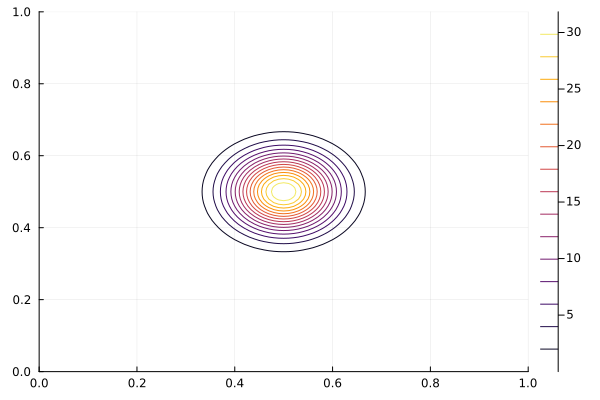

In [5]:
contour(0:0.01:1, 0:0.01:1, (x,y) -> nu₀([x,y]))

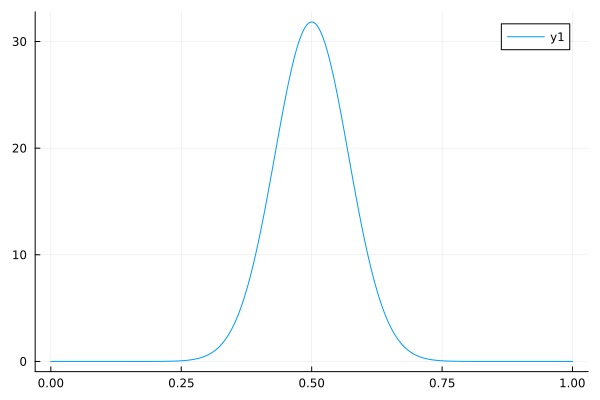

In [6]:
plot(0:0.001:1, x -> u₀(Point(0.5, x)))

In [7]:
uₕ = [ ]

ω̄ = [ ]
t̄ = [ ]
β̄ = [ ]

t_fom = 0
Random.seed!(1532)

nₒₛ = 6

for _ω in range(0, 2π, length=nₒₛ), _β in 1e-3 #10.0 .^ range(-5, -3, length=nₒₛ)
    
        w̄(x) = w̄(x, _ω)

        push!(uₕ, u₀)
        push!(t̄, t0)
        push!(ω̄, _ω)
        push!(β̄, _β)

        res(t,u,v) = ∫( ∂t(u)*v + 
                        + _β*(∇(v)⋅∇(u)) 
                        - (μ .* u .+ 1) .* (∇(v)⋅w̄) .* u)dΩ # residual for NL solver
        
        op = TransientFEOperator(res,U₂,V₂)
        sol_t = solve(ode_solver,op,u₀,t0,tF)

        _, t_fom = @timed for (_uₕ,_t) in sol_t

            if minimum((abs(_t % 0.05), abs(_t % 0.05 - 0.05))) < 1e-6
                push!(uₕ, _uₕ)
                push!(t̄, _t)
                push!(ω̄, _ω)
                push!(β̄, _β)
            end
        end
end

In [8]:
nₛ = length(uₕ)

126

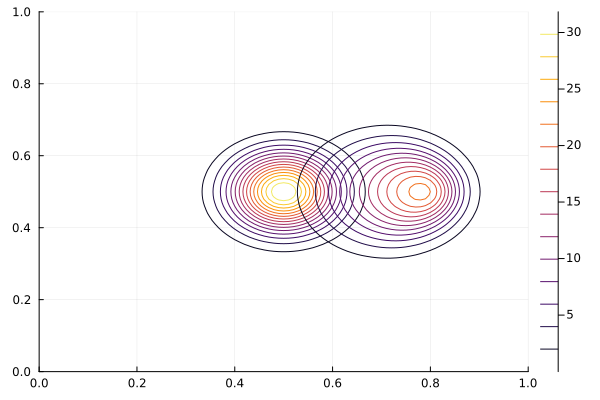

In [9]:
plt = contour()
contour!(0:0.01:1, 0:0.01:1, (x,y) -> uₕ[1](Point(x,y)))
for i in nₛ
    contour!(0:0.01:1, 0:0.01:1, (x,y) -> uₕ[i](Point(x,y)))
end
plt

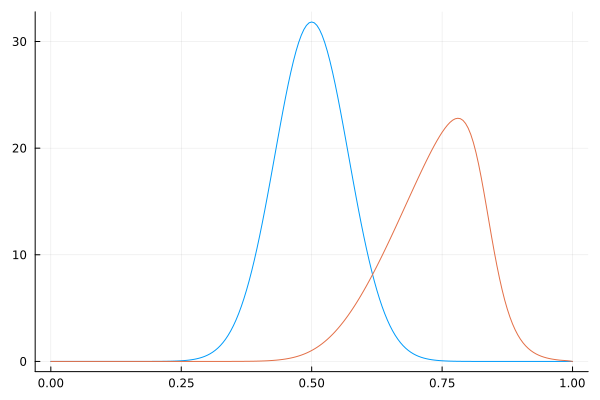

In [10]:
plt = plot()
for i in (1,nₛ)
    plot!(0:0.005:1, x -> uₕ[i](Point(x, 0.5)), legend = false)
end
plt

In [11]:
C = [ sum(∫((uₕ[i]) ⋅ (uₕ[j]) )dΩ) for i in eachindex(uₕ), j in eachindex(uₕ) ]
evd = eigen(C, sortby = x -> -abs(x) );

In [12]:
using LaTeXStrings

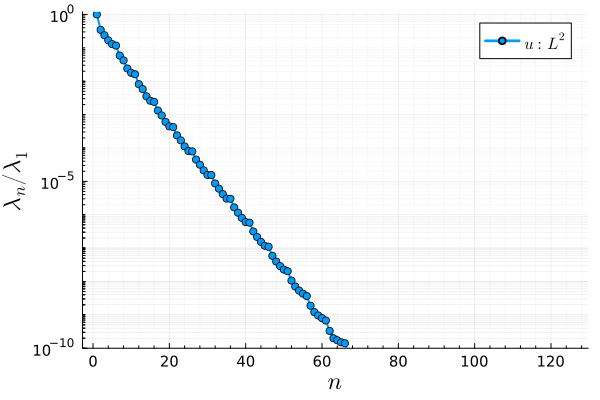

In [13]:
plot(abs.(evd.values[1:nₛ]) ./ evd.values[1], yaxis = :log, minorgrid = true, 
linewidth=2, marker = :circle, xlabel = L"n", ylabel = L"\lambda_n / \lambda_1", ylim = (1e-10,1.2), label = L"u : L^2",
legendfontsize=11, tickfontsize=10, xguidefontsize=16, yguidefontsize=16)

In [14]:
# obtain n
function _get_n(v, tol = 1e-3)
    for i in 1:length(v)
        if sum(v[1:i])/sum(v) > 1 - tol
            return i
        end
    end
end
n = _get_n(evd.values, tol^2)


40

In [15]:
ϕ = []
for i in 1:n
    fv = zero_free_values(V₂) # dof vector
    for j in eachindex(uₕ)
        fv_j = get_free_dof_values(uₕ[j])
        fv .+= fv_j * evd.vectors[j,i]
    end
    fv ./= sqrt(evd.values[i])
    _ϕ = FEFunction(V₂,fv)
    push!(ϕ, _ϕ)
end

In [16]:
#@test [ sum(∫(ϕ[i]*ϕ[j])dΩ) + sum(∫(∇(ϕ[i]) ⋅ ∇(ϕ[j]))dΩ) for i in eachindex(ϕ), j in eachindex(ϕ) ] ≈ I atol = 1e-6
@test [ sum(∫(ϕ[i]*ϕ[j])dΩ) for i in eachindex(ϕ), j in eachindex(ϕ) ] ≈ I atol = 1e-6

Test Passed

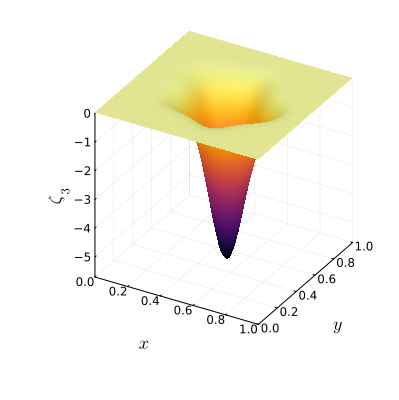

In [17]:
x_cord = 0:0.02:1
surface(x_cord,x_cord, (x,y) -> ϕ[1](Point(x,y)),
cbar = false, xlabel = L"x", ylabel = L"y", zlabel = L"\zeta_3", size = (400,400), camera = (30,30),
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12, zguidefontsize=12)

In [18]:
uₕₜ = [ ]

θ̄ₜ = [ ]
θ̄ₜ_samples = [ ]
ω̄ₜ = [ ]
t̄ₜ = [ ]
β̄ₜ = [ ]
ω̄ₜ_samples = []
β̄ₜ_samples = []

t_fom = 0
Random.seed!(1234)

nₒₜ = 10

for _ in 1:nₒₜ,
        _ω = rand(1)[1] * 2π
        _β = 1e-3 #10.0 .^ (rand(1)[1] * 2 - 5)

        push!(ω̄ₜ_samples, _ω)
        push!(β̄ₜ_samples, _β)
        w̄(x) = w̄(x, _ω)

        push!(uₕₜ, u₀)
        push!(t̄ₜ, t0)
        push!(ω̄ₜ, _ω)
        push!(β̄ₜ, _β)

        res(t,u,v) = ∫( ∂t(u)*v + 
                        + _β*(∇(v)⋅∇(u)) 
                        - (μ .* u .+ 1) .* (∇(v)⋅w̄) .* u)dΩ # residual for NL solver
        
        op = TransientFEOperator(res,U₂,V₂)
        sol_t = solve(ode_solver,op,u₀,t0,tF)

        _, t_fom = @timed for (_uₕ,_t) in sol_t

            #if minimum((abs(_t % 0.05), abs(_t % 0.05 - 0.05))) < 1e-6
                push!(uₕₜ, _uₕ)
                push!(t̄ₜ, _t)
                push!(ω̄ₜ, _ω)
                push!(β̄ₜ, _β)
            #end
        end
end

In [19]:
import Gridap.ODEs.ODETools: ODEOperator
import Gridap.ODEs.ODETools: Nonlinear
import Gridap.ODEs.ODETools: allocate_cache
import Gridap.ODEs.ODETools: update_cache!
import Gridap.ODEs.ODETools: allocate_residual
import Gridap.ODEs.ODETools: jacobian!
import Gridap.ODEs.ODETools: jacobians!
import Gridap.ODEs.ODETools: allocate_jacobian
import Gridap.ODEs.ODETools: residual!

struct RBODEOperator{T<:Real,C} <: ODEOperator{C}
    M # mass matrix
    K # linear part
    A # quadratic part
    order::Integer
end
  
get_order(op::RBODEOperator) = op.order
  
function residual!(r::AbstractVector,op::RBODEOperator,t::Real,x::NTuple{2,AbstractVector},ode_cache)
    u,u_t = x
    A_uu = zero(u)
    if μ != 0
        for j in eachindex(u), k in eachindex(u)
            A_uu .+= op.A(t)[:,j,k] * u[j] * u[k] 
        end
    end
    r .= op.M(t) * u_t .+ op.K(t) * u .+ A_uu
end
  
function allocate_residual(op::RBODEOperator,u::AbstractVector,cache)
    zero(u)
end

function jacobian!(J::AbstractMatrix,
    op::RBODEOperator,
    t::Real,
    x::NTuple{2,AbstractVector},
    i::Int,
    γᵢ::Real,
    ode_cache)
    @assert get_order(op) == 1
    @assert 0 < i <= get_order(op)+1
    u,u_t = x

    if i==1
        A_u1 = zero(op.K(t))
        A_u2 = zero(op.K(t))
        if μ != 0
            for i in eachindex(u), j in eachindex(u), k in eachindex(u)
                A_u1[i,j] += op.A(t)[i,j,k] * u[k] # first index is test function, second is trial. k is summed
                A_u2[i,j] += op.A(t)[i,k,j] * u[k]
            end
        end
        J .+= op.K(t) .+ A_u1 .+ A_u2
    elseif i==2
        J .+= op.M(t) .* γᵢ
    end
    J
end

function jacobians!(
    J::AbstractMatrix,
    op::RBODEOperator,
    t::Real,
    x::Tuple{Vararg{AbstractVector}},
    γ::Tuple{Vararg{Real}},
    ode_cache)
    @assert length(γ) == get_order(op) + 1
    for order in 1:get_order(op)+1
      jacobian!(J,op,t,x,order,γ[order],ode_cache)
    end
    J
  end
  
function allocate_jacobian(op::RBODEOperator,u::AbstractVector,cache)
    spzeros(size(op.M(0.0)))
end
  
  allocate_cache(op::RBODEOperator) = nothing
  allocate_cache(op::RBODEOperator,v::AbstractVector) = (similar(v),nothing)
  allocate_cache(op::RBODEOperator,v::AbstractVector,a::AbstractVector) = (similar(v),similar(a),nothing)
  update_cache!(cache,op::RBODEOperator,t::Real) = cache

update_cache! (generic function with 4 methods)

In [20]:
# RB projection
ũ₀ = [ sum(∫(nu₀ * _ϕ)dΩ) for _ϕ in ϕ]
uᵣ₀ = FEFunction(V₂, ũ₀' * get_free_dof_values.(ϕ))
;

In [21]:
# generate / collect the training data:
uₕₜ_rb = [ ]
ũ_rb = [ ]
t_rb_assem = 0
t_rb = 0
t_rb_map = 0

for _ω in ω̄ₜ_samples, _β in 1e-3 # β̄ₜ_samples

    w̄(x) = w̄(x, _ω)

    #res(t,u,v) = ∫( ∂t(u)*v + 
    #             + β*(∇(v)⋅∇(u)) 
    #             - (μ .* u .+ 1) .* (∇(v)⋅w̄) .* u)dΩ # residual for NL solver

    _, _t_rb_assem = @timed begin
        # Assemble reduced operators
        _K =    (_β * [ sum(∫( ∇(ϕ[i]) ⋅ ∇(ϕ[j]) )dΩ) for i in 1:n, j in 1:n ]
                - [ sum(∫((∇(ϕ[i]) ⋅ w̄) .* ϕ[j])dΩ) for i in 1:n, j in 1:n ] )

        if μ == 0
            _A = zeros(n,n,n)
        else
            _A = - μ * [ sum(∫(∇(ϕ[i]) ⋅ w̄ * ϕ[j] * ϕ[k])dΩ) for i in 1:n, j in 1:n, k in 1:n ]
        end
        
        _M = diagm(ones(n))
    end

    push!(ũ_rb, ũ₀)
    push!(uₕₜ_rb, uᵣ₀)

    rbop = RBODEOperator{Float64,Nonlinear}(t -> _M, t -> _K, t -> _A, 1)
    rbsol_t = solve(ode_solver, rbop, ũ_rb[1], t0, tF)

    _, _t_rb = @timed for (u,_t) in rbsol_t
        push!(ũ_rb, u)

        #if minimum((abs(_t % 0.05), abs(_t % 0.05 - 0.05))) < 1e-6 

            _, _t_rb_map = @timed begin
                _uₕₜ_rb = FEFunction(V₂, u' * get_free_dof_values.(ϕ))
            end
            t_rb_map += _t_rb_map

            push!(uₕₜ_rb, _uₕₜ_rb)
        #end
    end


    t_rb_assem += _t_rb_assem
    t_rb += _t_rb
end

In [22]:
t_rb_assem, t_rb

(782.724701918, 20.484953168000004)

In [23]:
L2(e) = sqrt(sum( ∫( e*e )*dΩ ))
H1(e) = sqrt(sum( ∫( e*e + ∇(e)⋅∇(e) )*dΩ ))

H1 (generic function with 1 method)

In [24]:
ΔL2_rb_online = [ L2(uₕₜ_rb[i]-uₕₜ[i]) / L2(uₕₜ[i]) for i in eachindex(uₕₜ) ]
ΔH1_rb_online = [ H1(uₕₜ_rb[i]-uₕₜ[i]) / H1(uₕₜ[i]) for i in eachindex(uₕₜ) ]
Statistics.mean(ΔL2_rb_online), Statistics.std(ΔL2_rb_online; corrected=false), maximum(ΔL2_rb_online)

(0.2598058512760253, 0.23021742247461133, 0.8452560871313265)

In [25]:
Statistics.mean(ΔH1_rb_online), Statistics.std(ΔH1_rb_online; corrected=false), maximum(ΔH1_rb_online)

(0.48361418634105957, 0.40362375152213814, 1.3819127855288351)

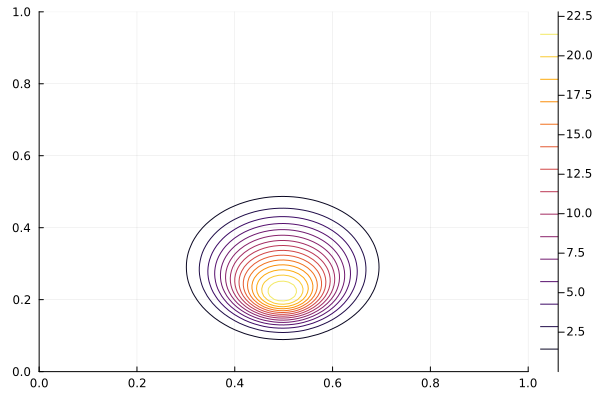

In [26]:
contour(0:0.01:1, 0:0.01:1, (x,y) -> uₕₜ[end](Point(x,y)))

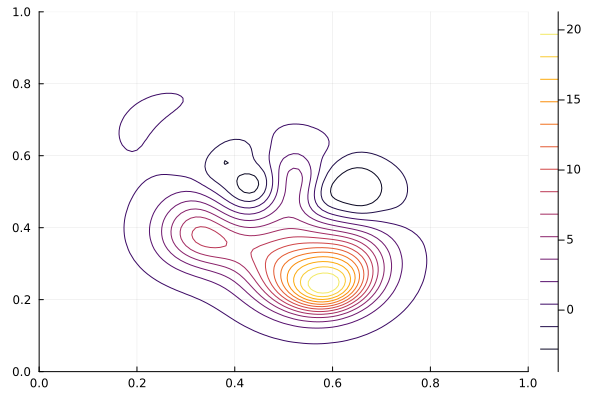

In [27]:
contour(0:0.01:1, 0:0.01:1, (x,y) -> uₕₜ_rb[end](Point(x,y)))

# Transport

In [28]:
N_fine = highorder*N
partition_fine = (N_fine,N_fine)
model_fine = CartesianDiscreteModel(domain,partition_fine)

V₁ = FESpace(
  model_fine,
  ReferenceFE(lagrangian,Float64,1),
  conformity=:H1
);

In [29]:
N_fine

96

In [30]:
Ψ = FESpace(
  model,
  ReferenceFE(lagrangian,Float64,3),
  conformity=:H1,
  #constraint=:zeromean
);

In [31]:
# Wasserstein calcs
d = 2
c = WassersteinDictionaries.get_cost_matrix_separated(N_fine+1, d, a = [domain[1] domain[3]], b = [domain[2] domain[4]])

ε = 1e-3

k = WassersteinDictionaries.get_gibbs_matrix(c, ε)
minimum(k[1])

7.124576406741286e-218

In [32]:
ūₕ = [ reshape( abs.(get_free_dof_values( interpolate_everywhere(Interpolable((_uₕ)), V₁) )),N_fine+1,N_fine+1) for _uₕ in uₕ];
#ūₕ = [ reshape( abs.(get_free_dof_values( interpolate_everywhere(Interpolable(∇(_uₕ)⋅∇(_uₕ)), V₁) )),N_fine+1,N_fine+1) for _uₕ in uₕ];
#ūₕ = [ reshape( abs.(get_free_dof_values( interpolate_everywhere(Interpolable(_κₕ), V₁) )),N_fine+1,N_fine+1) for _κₕ in κₕ];
;

In [33]:
for _ūₕ in ūₕ
    _ūₕ ./= sum(_ūₕ) * (1 / N_fine)^2
end

In [34]:
nₛ

126

In [35]:
1:21:105

1:21:85

In [36]:
# calculate reference measure
SPB = SinkhornParameters(256, ε)
SPB.debias = true
SPB.averaged_updates = false
SPB.update_potentials = false

MC = MatrixCache(N_fine+1)
SPB.tol = 1e-12

Random.seed!(2345)

nᵦ = 25
ūₕᵦ = ūₕ[rand(1:nₛ,nᵦ)]

#nᵦ = nₛ
#ūₕᵦ = ūₕ

#
#ūₕᵦ = ūₕ[1:21:nₛ]
#nᵦ = length(ūₕᵦ)

a_₀ = [ones(size(_ūₕ)) for _ūₕ in ūₕᵦ] 
d₀ = ones(size(ūₕ[1]));

In [37]:
@time ūₕ_ref = sinkhorn_barycenter_sep([ 1/nᵦ for _ in ūₕᵦ], ūₕᵦ, a_₀, d₀, k, SPB, MC);
#ūₕ_ref = ūₕ[1];
;

  7.315268 seconds (4.38 M allocations: 201.799 MiB, 0.41% gc time, 20.54% compilation time)


In [38]:
function safe_log(x)
    if x > 1e-20
        return log(x)
    else
        return -100.0
    end
end

safe_log (generic function with 1 method)

In [39]:
log_ūₕ = [ safe_log.(_ūₕ) for _ūₕ in ūₕ ];
log_ūₕ_ref = safe_log.(ūₕ_ref);

In [40]:
# compute transport potentials from ū to ū_ref
ψ̄  = [ zero(_ūₕ) for _ūₕ in ūₕ ]
ψ̄ᶜ = [ zero(_ūₕ) for _ūₕ in ūₕ ] 

a₀ = zero(ūₕ[1])
b₀ = zero(ūₕ[1])
d₀₁ = zero(ūₕ[1])
d₀₂ = zero(ūₕ[1])

SP = SinkhornParameters(128, ε)
SP.tol = 1e-12

SP.debias = false
SP.averaged_updates = false
SP.update_potentials = true

for s in eachindex(ūₕ)

    a₀ .= 1.0
    b₀ .= 1.0

    #ψ[s] .= log.(a_₀[s]) * ε # if barycenter was computed from all snaps

    sinkhorn_dvg_sep( ūₕ[s], ūₕ_ref, a₀, b₀, d₀₁, d₀₂, k, SP, MC)
    ψ̄[s] .= log.(a₀) * ε
    ψ̄ᶜ[s] .= log.(b₀) * ε

    #WassersteinDictionaries.softmin_separated!(ψ̄ᶜ[s], ψ̄[s], log_ūₕ[s], 1e-3, c, MC[:t1,Float64], MC[:t2,Float64])
end

In [41]:
uₕ_ref = interpolate_everywhere( Interpolable( FEFunction(V₁, vec(ūₕ_ref))), Ψ);
#uₕ_ref_1 = FEFunction(V₁, vec(ūₕ_ref));
;

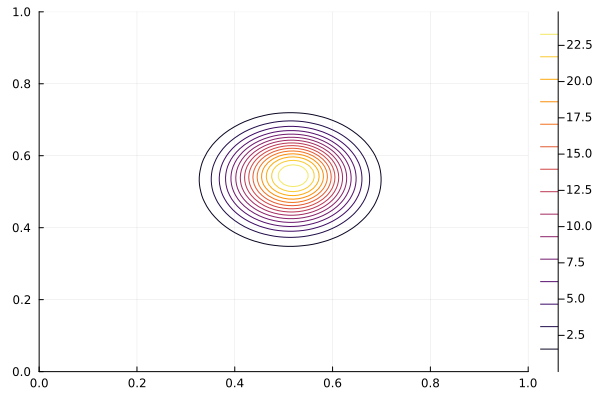

In [42]:
contour(0:0.01:1, 0:0.01:1, (x,y) -> uₕ_ref(Point(x,y)))

In [43]:
# H¹₀ projections

Γ = BoundaryTriangulation(model)
nb = get_normal_vector(Γ)
dΓ = Measure(Γ,degree)

Measure()

In [44]:
# H¹₀ projections
ϵ = 1
δ = 0
δ_barrier = 1e9 * N

ψ = []
ψᶜ = []

nb = get_normal_vector(Γ)
Γ = BoundaryTriangulation(model)
dΓ = Measure(Γ,degree)

#=
for i in eachindex(ψ̄)
    ψ₁ = interpolate_everywhere( Interpolable( FEFunction(V₁, vec(ψ̄[i]))), Ψ)

    a(u,v) = ∫( (∇(v)⋅∇(u)) )dΩ + ϵ * ∫( v*u )dΩ + δ * ∫( nb⋅(nb⋅∇∇(u))*v )dΓ + δ_barrier * ∫( (nb⋅∇(u))*v )dΓ
    b(v) = ∫( (∇(v)⋅∇(ψ₁)) )dΩ + ϵ * ∫( v*ψ₁ )dΩ #- ∫( (nb⋅∇(ψ₁))*v )dΓ 

    op = AffineFEOperator(a,b,TrialFESpace(Ψ),Ψ)

    push!(ψ, solve(op))
    
    #push!(ψ, ψ₁)
end
=#

for i in eachindex(ψ̄ᶜ)
    ψ₁ = interpolate_everywhere( Interpolable( FEFunction(V₁, vec(ψ̄ᶜ[i]))), Ψ)

    a(u,v) = ∫( (∇(v)⋅∇(u)) )dΩ + ϵ * ∫( v*u )dΩ # + δ_barrier * ∫( (nb⋅∇(u))*v )dΓ
    b(v) = ∫( (∇(v)⋅∇(ψ₁)) )dΩ + ϵ * ∫( v*ψ₁ )dΩ #- ∫( (nb⋅∇(ψ₁))*v )dΓ 

    op = AffineFEOperator(a,b,TrialFESpace(Ψ),Ψ)

    push!(ψᶜ, solve(op))

    #push!(ψᶜ, ψ₁)
end

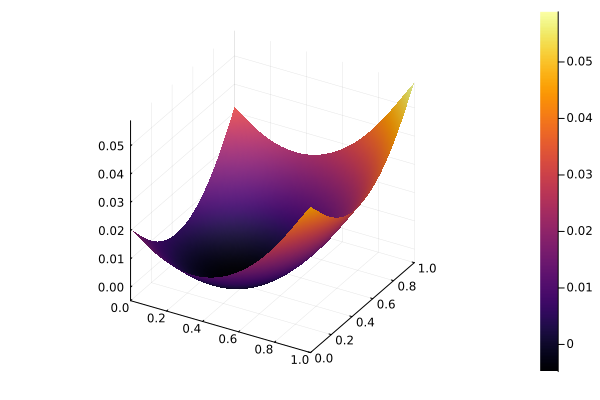

In [45]:
surface(0:0.01:1, 0:0.01:1, (x,y) -> ψᶜ[1](Point(y,x)))

In [46]:
# Assemble C matrix
Cψ = [ sum(∫(∇(ψᶜᵢ)⋅∇(ψᶜⱼ)*uₕ_ref)dΩ) for ψᶜᵢ in ψᶜ, ψᶜⱼ in ψᶜ ]
evdψ = eigen(Cψ, sortby = x -> -abs(x))
;

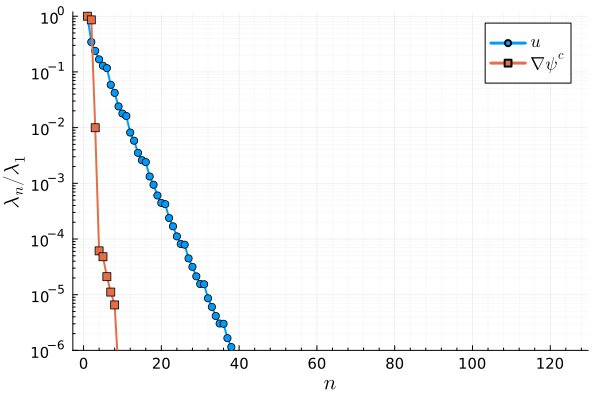

In [47]:
plot(abs.(evd.values[1:nₛ]) ./ evd.values[1], yaxis = :log, minorgrid = true,
linewidth=2, marker = :circle, xlabel = L"n", ylabel = L"\lambda_n / \lambda_1", ylim = (1e-6,1.2), label = L"u",
legendfontsize=12, tickfontsize=10, xguidefontsize=14, yguidefontsize=14) 
plot!(abs.(evdψ.values[1:nₛ]) ./ evdψ.values[1], linewidth=2, marker = :square, label = L"\nabla \psi^c",
legendfontsize=12, tickfontsize=10, xguidefontsize=14, yguidefontsize=14) 

In [48]:
# obtain m
m = _get_n(evdψ.values, tol)

3

In [49]:

1 - sum(evdψ.values[1:m]) / sum(evdψ.values)

7.954874311455473e-5

In [50]:
# obtain the transport modes
ξᶜ = []
for i in 1:m
    fv = zero_free_values(Ψ) # dof vector
    for j in eachindex(uₕ)
        fv_j = get_free_dof_values(ψᶜ[j])
        fv .+= fv_j * evdψ.vectors[j,i]
    end
    fv ./= sqrt(evdψ.values[i])
    _ξᶜ = FEFunction(Ψ,fv)
    push!(ξᶜ, _ξᶜ)
end

In [51]:
@test [ sum(∫(∇(ξᶜ[i])⋅∇(ξᶜ[j])*uₕ_ref)dΩ)  for i in eachindex(ξᶜ), j in eachindex(ξᶜ) ] ≈ I atol = 1e-6

Test Passed

In [52]:
# plot some transport modes
x_cord = 0:0.02:1
plts = []
for i in 1:(minimum((m,4)))
    push!(plts, contourf(x_cord,x_cord, (x,y) -> ξᶜ[i](Point(x,y)) - ξᶜ[i](Point(0.5,0.5)) ))
end

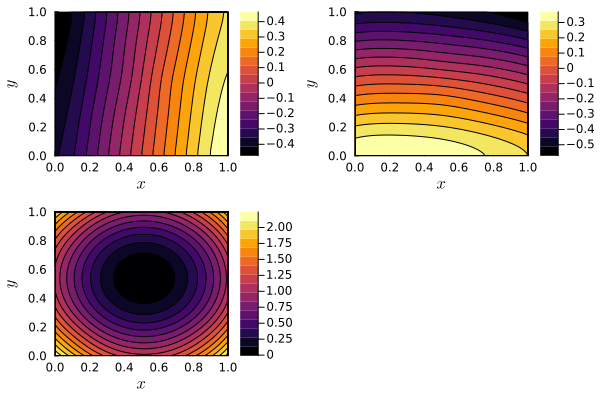

In [53]:
plot(plts..., xlabel = L"x", ylabel = L"y", cgrad = :thermal, legend=false, grid=false)

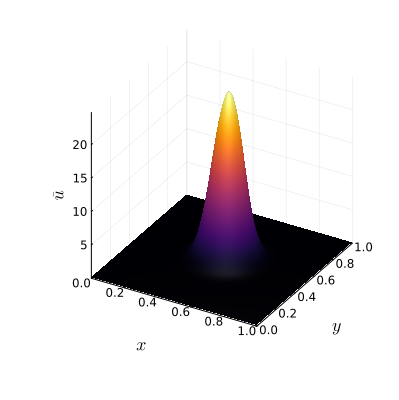

In [54]:
x_cord = 0:0.01:1
surface(x_cord,x_cord, (x,y) -> uₕ_ref(Point(x,y)),
cbar = false, xlabel = L"x", ylabel = L"y", zlabel = L"\bar u", size = (400,400), camera = (30,30),
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12, zguidefontsize=12)
#savefig("../figs/ubar.pdf")

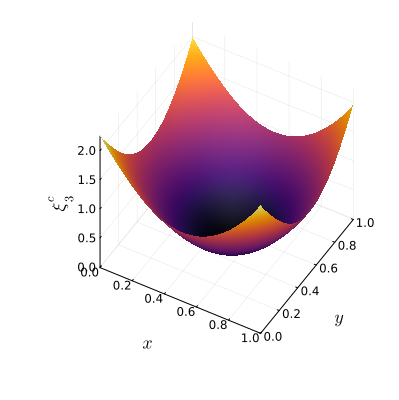

In [55]:
x_cord = 0:0.01:1
surface(x_cord,x_cord, (x,y) -> ξᶜ[3](Point(x,y)) - ξᶜ[3](Point(0.5,0.5)),
cbar = false, xlabel = L"x", ylabel = L"y", zlabel = L"\xi^c_3", size = (400,400), camera = (30,45),
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12, zguidefontsize=12)
#savefig("../figs/xi3.pdf")

In [56]:
# get the reduced representation of the ψ
λ = [ [ sum(∫(∇(_ψᶜ)⋅∇(_ξᶜ)*uₕ_ref)dΩ) for _ξᶜ in ξᶜ ] for _ψᶜ in ψᶜ ]
ψᶜᵣ = [ FEFunction(Ψ, _λ' * get_free_dof_values.(ξᶜ)) for _λ in λ ]
;

In [57]:
# L2_ψ = [ sum(∫(∇(ψᶜ[i] - ψᶜᵣ[i])⋅∇(ψᶜ[i] - ψᶜᵣ[i])*uₕ_ref)dΩ) / sum(∫(∇(ψᶜ[i])⋅∇(ψᶜ[i])*uₕ_ref)dΩ) for i in eachindex(ψᶜ) ];
L2_ψ = [ sum(∫(∇(ψᶜ[i] - ψᶜᵣ[i])⋅∇(ψᶜ[i] - ψᶜᵣ[i])*uₕ_ref)dΩ) for i in eachindex(ψᶜ) ];

In [58]:
Statistics.mean(L2_ψ), Statistics.std(L2_ψ; corrected=false), maximum(L2_ψ)

(1.5919726521568348e-6, 1.5795780284295802e-6, 6.2869013726753845e-6)

In [59]:
function c̄_transform(_λ, ξᶜ, ε = 1e-9)

    _ψᶜᵣ = FEFunction(Ψ, _λ' * get_free_dof_values.(ξᶜ))

    _ψᶜᵣ₀ = interpolate_everywhere(Interpolable(_ψᶜᵣ), V₁)

    _ψ̄ᶜᵣ = reshape( get_free_dof_values(_ψᶜᵣ₀), N_fine+1, N_fine+1)

    #_ψ̄ᶜᵣ = reshape(_λ' * get_free_dof_values.(ξᶜ), N2+1, N2+1)

    # approximate mapping to reference configuration
    _ψ̄ᵣ = zero(_ψ̄ᶜᵣ)
    WassersteinDictionaries.softmin_separated!(_ψ̄ᵣ, _ψ̄ᶜᵣ, log_ūₕ_ref, 1e-6, c, MC[:t1,Float64], MC[:t2,Float64])
    #WassersteinDictionaries.softmin_separated!(_ψ̄ᵣ, _ψ̄ᶜᵣ, log_unif, 1e-12, c, MC[:t1,Float64], MC[:t2,Float64])
    
    _ψᵣ₀ = FEFunction(V₁, vec(_ψ̄ᵣ))

    _ψᵣ = interpolate_everywhere( Interpolable(_ψᵣ₀), Ψ)

    #_ψᵣ = FEFunction(Ψ, vec(_ψ̄ᵣ)) 

    _ψᵣ
end

c̄_transform (generic function with 2 methods)

In [60]:
id = TensorValue(diagm(ones(2)))

TensorValue{2, 2, Float64, 4}(1.0, 0.0, 0.0, 1.0)

In [61]:
function pushfwd(u,ψ,V)

    T = Float64

    u_cache = Gridap.CellData.return_cache(u, Point(0,0))
    psi_cache = Gridap.CellData.return_cache(∇(ψ), Point(0,0))
    #psi_cache_2 = Gridap.CellData.return_cache(∇∇(ψ), Point(0,0))

    function uT(y)
        dy = Gridap.evaluate!(psi_cache, ∇(ψ), y)
        Ty = y - dy
        if Ty[1] < domain[1] || Ty[1] > domain[2] || Ty[2] < domain[3] || Ty[2] > domain[4]
            return zero(T)
        else
            return Gridap.evaluate!(u_cache, u, Ty) # * det( id - Gridap.evaluate!(psi_cache_2, ∇∇(ψ), y) )
        end
    end

    U = u.fe_space
    Ω = get_triangulation(u)

    dΩc = Measure(Ω,2*highorder)
    a(u,v) = ∫( u*v )*dΩc
    l(v) = ∫( v*uT )*dΩc
    op = AffineFEOperator(a,l,U,V)

    return solve(op)
end


pushfwd (generic function with 1 method)

In [62]:
@time _Tuₕ = pushfwd(uₕ[1],ψᶜᵣ[1],V₂)

  3.124001 seconds (5.57 M allocations: 359.027 MiB, 1.80% gc time, 95.91% compilation time)


SingleFieldFEFunction():
 num_cells: 1024
 DomainStyle: ReferenceDomain()
 Triangulation: BodyFittedTriangulation()
 Triangulation id: 9136785091803000489

In [63]:
Tuₕ = copy(uₕ);
@time for i in eachindex(uₕ) 
    Tuₕ[i] = pushfwd(uₕ[i],ψᶜᵣ[i],V₂)
end

 15.112364 seconds (102.14 M allocations: 12.324 GiB, 6.64% gc time)


In [64]:
cpal = palette(:thermal, 16);

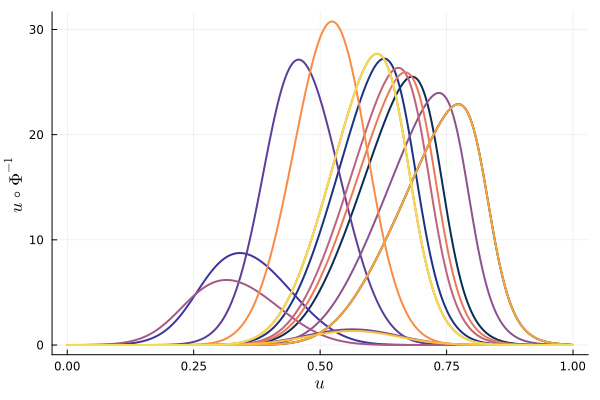

In [65]:
x_cord = 0:0.001:1
plt = plot()
_i = 1
idxs = rand(1:nₛ,15)
for i in idxs
    plot!(x_cord, x -> uₕ[i](Point(x,0.5)), legend = false,
    linewidth = 2, color = cpal[_i], xlabel = L"u", ylabel = L"u \circ \Phi^{-1}",
    legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
    _i += 1
end
plt

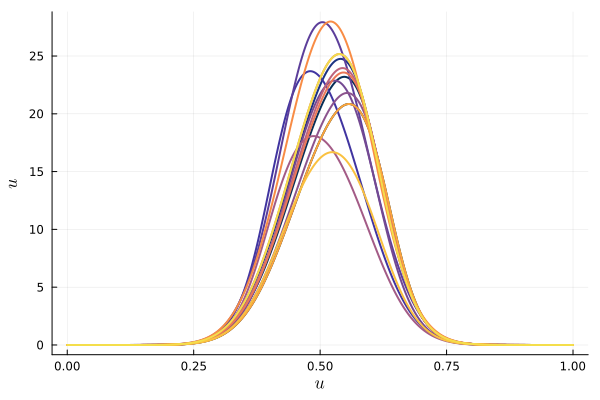

In [66]:
plt = plot()
_i = 1
for i in idxs
    plot!(x_cord, x -> Tuₕ[i](Point(x,0.5)), legend = false,
    linewidth = 2, color = cpal[_i], xlabel = L"u", ylabel = L"u",
    legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
    _i += 1
end
plt

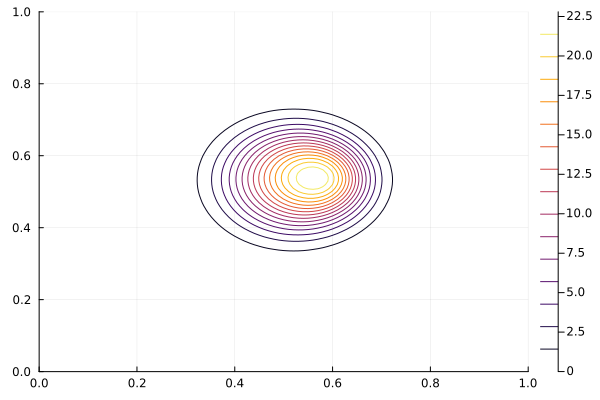

In [67]:
contour(0:0.01:1, 0:0.01:1,(x,y) -> Tuₕ[end](Point(x,y)))

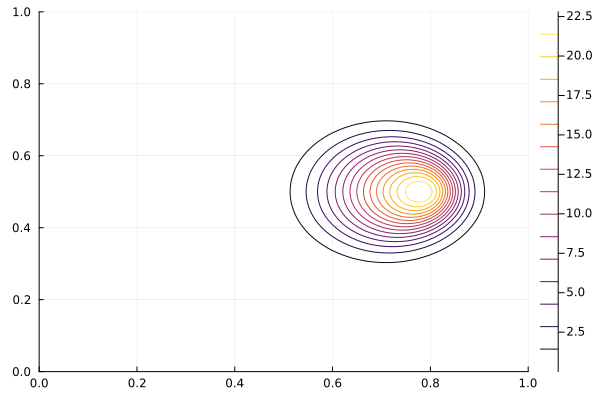

In [68]:
contour(0:0.01:1, 0:0.01:1,(x,y) -> uₕ[end](Point(x,y)))

In [69]:
# Assemble C matrix
CT = [ sum(∫( (uₕᵢ) ⋅ (uₕⱼ))dΩ) for uₕᵢ in Tuₕ, uₕⱼ in Tuₕ ]
evdT = eigen(CT, sortby = x -> -abs(x))
;

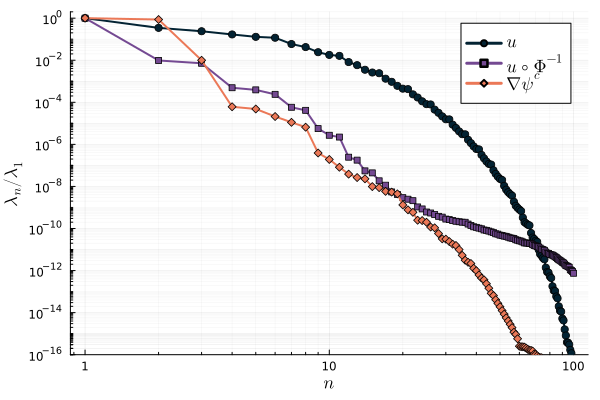

In [70]:
cpal = palette(:thermal, 4);

plot(abs.(evd.values[1:100]) ./ evd.values[1], yaxis = :log, minorgrid = true, xaxis = :log,
yticks = 10.0 .^ (-16:2:0), xticks = ( [1,10,100], string.([1,10,100]) ),
linewidth=2, marker = :circle, xlabel = L"n", ylabel = L"\lambda_n / \lambda_1", ylim = (1e-16,2), label = L"u", color = cpal[1],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
plot!(abs.(evdT.values[1:100]) ./ evdT.values[1], linewidth=2, marker = :square, markersize = 3, label = L"u \circ \Phi^{-1}", color = cpal[2])
plot!(abs.(evdψ.values[1:100]) ./ evdψ.values[1], linewidth=2, marker = :diamond, label = L"\nabla \psi^c", color = cpal[3])
#savefig("../figs/evds_log.pdf")

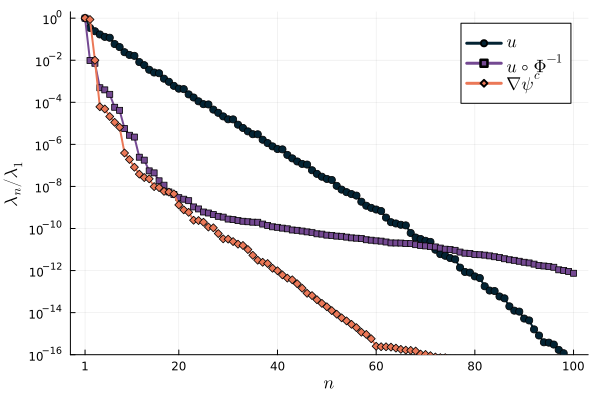

In [71]:
cpal = palette(:thermal, 4);

plot(abs.(evd.values[1:100]) ./ evd.values[1], yaxis = :log, minorgrid = false, yticks = 10.0 .^ (-16:2:0), xticks = vcat(1,20:20:100),
linewidth=2, marker = :circle, xlabel = L"n", ylabel = L"\lambda_n / \lambda_1", ylim = (1e-16,2), label = L"u", color = cpal[1],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
plot!(abs.(evdT.values[1:100]) ./ evdT.values[1], linewidth=2, marker = :square, markersize = 3, label = L"u \circ \Phi^{-1}", color = cpal[2])
plot!(abs.(evdψ.values[1:100]) ./ evdψ.values[1], linewidth=2, marker = :diamond, label = L"\nabla \psi^c", color = cpal[3])
#savefig("../figs/evds.pdf")

In [72]:
nₘ = _get_n(evdT.values, tol)
n, m, nₘ

(40, 3, 4)

In [73]:
# obtain the reference basis
ϕσ = []
for i in 1:nₘ
    fv = zero_free_values(V₂) # dof vector
    for j in eachindex(Tuₕ)
        fv_j = get_free_dof_values(Tuₕ[j])
        fv .+= fv_j * evdT.vectors[j,i]
    end
    fv ./= sqrt(evdT.values[i])
    _ϕσ = FEFunction(V₂,fv)
    push!(ϕσ, _ϕσ)
end

In [74]:
# plot some reference RB functions
x_cord = 0:0.01:1
plts = []
for i in 1:(minimum((nₘ,4)))
    push!(plts, contour(x_cord,x_cord, (x,y) -> ϕσ[i](Point(x,y)) ))
end

In [75]:
#contour(x_cord,x_cord, (x,y) -> ϕσ[25](Point(x,y)))

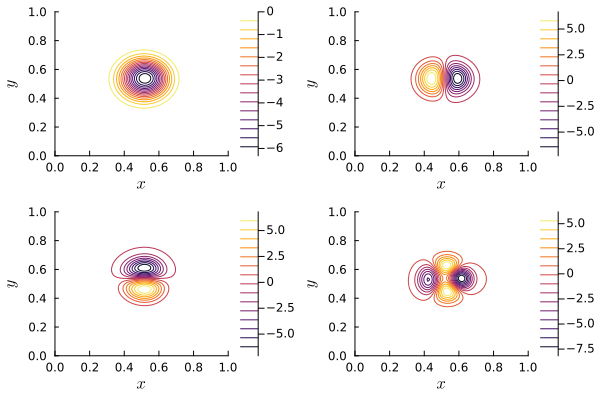

In [76]:
plot(plts..., xlabel = L"x", ylabel = L"y", legend=false, grid=false)

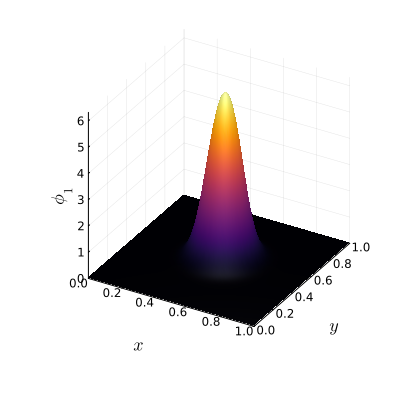

In [77]:
x_cord = 0:0.01:1
surface(x_cord,x_cord, (x,y) -> -ϕσ[1](Point(x,y)),
cbar = false, xlabel = L"x", ylabel = L"y", zlabel = L"\phi_1", size = (400,400), camera = (30,30),
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12, zguidefontsize=12)
#savefig("../figs/phi1.pdf")

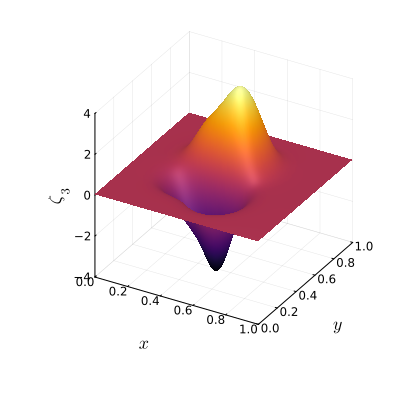

In [78]:
x_cord = 0:0.01:1
surface(x_cord,x_cord, (x,y) -> -ϕ[3](Point(x,y)),
cbar = false, xlabel = L"x", ylabel = L"y", zlabel = L"\zeta_3", size = (400,400), camera = (30,30),
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12, zguidefontsize=12)
#savefig("../figs/zeta3.pdf")

In [79]:
m

3

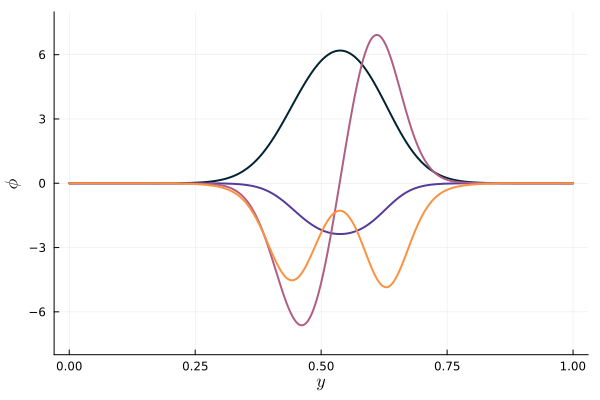

In [80]:
plt = plot()
_i = 1
cpal = palette(:thermal, 1 + minimum((7,nₘ)))
for i in 1:minimum((7,nₘ))
    plot!(0:0.001:1,  x -> -ϕσ[i](Point([0.5,x])), legend = false,
    linewidth = 2, color = cpal[i], xlabel = L"y", ylabel = L"\phi", ylim = (-8,8),
    legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
    _i += 1
end
plt
#savefig("../figs/phis2.pdf")

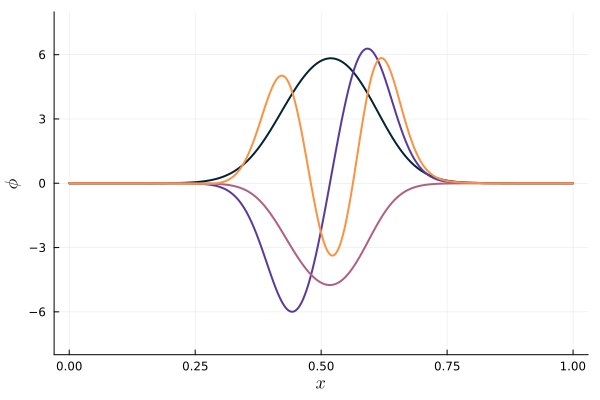

In [81]:
plt = plot()
_i = 1
cpal = palette(:thermal, 1 + minimum((7,nₘ)))
for i in 1:minimum((7,nₘ))
    plot!(0:0.001:1,  x -> -ϕσ[i](Point([x,0.5])), legend = false,
    linewidth = 2, color = cpal[i], xlabel = L"x", ylabel = L"\phi", ylim = (-8,8),
    legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
    _i += 1
end
plt
#savefig("../figs/phis1.pdf")

In [82]:
m

3

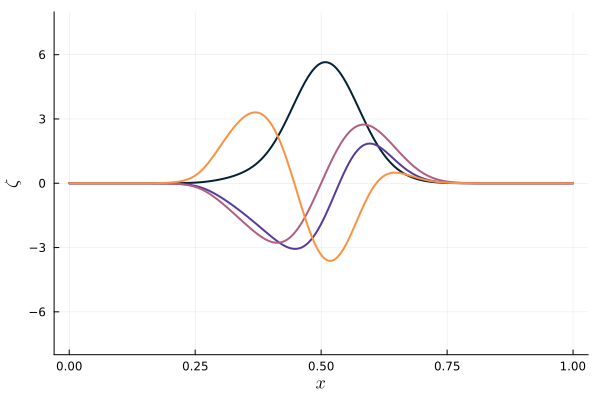

In [83]:
plt = plot()
_i = 1
for i in 1:minimum((7,nₘ))
    plot!(0:0.001:1,  x -> -ϕ[i](Point([x,x])), legend = false,
    linewidth = 2, color = cpal[i], xlabel = L"x", ylabel = L"\zeta",  ylim = (-8,8),
    legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
    _i += 1
end
plt
#savefig("../figs/zetas.pdf")

In [84]:
# Project the transported basis for snapshot _i
#=
ũ_ref = []

for k in eachindex(Tuₕ)
    
    J = abs(det(id - ∇∇(ψᶜᵣ[k])))
    #J = abs(det(id))
    _b = [ sum(∫(Tuₕ[k] * ϕσ[i] * J)dΩ) for i in eachindex(ϕσ) ]
    _M = [ sum(∫(ϕσ[j] * ϕσ[i] * J)dΩ) for i in eachindex(ϕσ), j in eachindex(ϕσ) ];
    push!(ũ_ref, _M \ _b)
    #push!(ũ_ref, [ sum(∫(Tuₕ[k] * ϕσ[i])dΩ) for i in eachindex(ϕσ) ] )
end
uᵣₜ_ref = [ FEFunction(V₂, _ũ_ref' * get_free_dof_values.(ϕσ)) for _ũ_ref in ũ_ref ];
ΔL2_trb_ref = [ sqrt(sum(∫(
                        (uᵣₜ_ref[i]-Tuₕ[i])*
                        (uᵣₜ_ref[i]-Tuₕ[i])*
                        (abs(det(id - ∇∇(ψᶜᵣ[i]))))
                        )dΩ)) / L2(uₕ[i]) for i in eachindex(uₕ) ];
_i = rand(1:nₜ)
crssc = μ̄ₜ[_i][2] + 0.5
_uᵣₜ = pushfwd(uᵣₜ_ref[_i],ψᵣ[_i],V₂)
plot(x_cord, x -> uₕ[_i](Point([x,crssc])), label = "u", legend = :topright)
plot!(x_cord, x -> _uᵣₜ(Point([x,crssc])), label = "uᵣₜ (m=$m, n=$nₘ)")
plot!(x_cord, x -> uᵣ[_i](Point([x,crssc])), label = "uᵣ (m=0,n=$n)")
Statistics.mean(ΔL2_rb_proj), Statistics.mean(ΔL2_trb_ref), maximum(ΔL2_rb_proj), maximum(ΔL2_trb_ref)
=#

In [85]:
using GaussianProcesses

In [87]:
#Select mean and covariance function
mZero = MeanZero()
kern = SE(0.0,0.0)
logObsNoise = -12.0 

gp = []

_μ = zeros(2, nₛ)
for i in 1:nₛ
    _μ[2,i] = ω̄[i]
    _μ[1,i] = t̄[i]
end

for _m in 1:m
    _λ = [_λ[_m] for _λ in λ]

    _gp = GP(_μ,_λ,mZero,kern,logObsNoise)
    push!(gp, _gp)
end

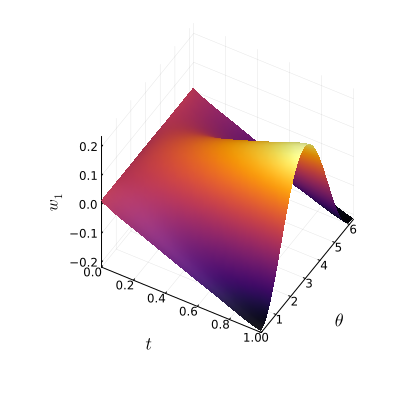

In [88]:
surface(gp[1]; legend = false, xlabel = L"t", ylabel = L"θ", zlabel = L"w_1", 
xlim = (0,tF), ylim = (0,2π), camera = (30, 45), size = (400,400),
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
#scatter!(t̄, ω̄, predict_y(gp[1], _μ)[1], label = false, color = :white, markersize = 2)
#savefig("../figs/w1.pdf")

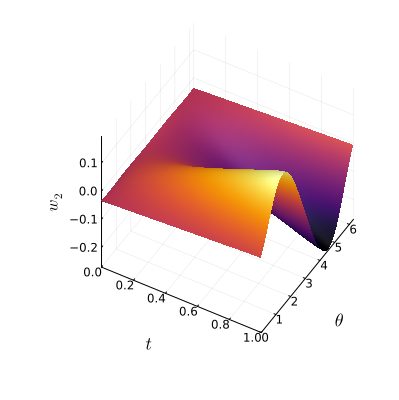

In [89]:
surface(gp[2]; legend = false, xlabel = L"t", ylabel = L"θ", zlabel = L"w_2", 
xlim = (0,tF), ylim = (0,2π), camera = (30, 45), size = (400,400),
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
#scatter!(t̄, ω̄, predict_y(gp[2], _μ)[1], label = false, color = :white, markersize = 2)
#savefig("../figs/w2.pdf")

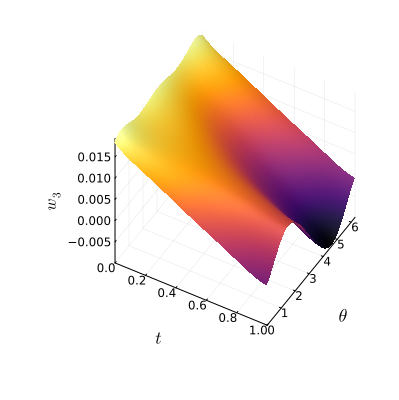

In [90]:
surface(gp[3]; legend = false, xlabel = L"t", ylabel = L"θ", zlabel = L"w_3", 
xlim = (0,tF), ylim = (0,2π), camera = (30, 45), size = (400,400),
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
#scatter!(t̄, ω̄, predict_y(gp[3], _μ)[1], label = false, color = :white, markersize = 2)
#savefig("../figs/w3.pdf")

In [91]:
function get_λ(_μ, gp)
    _μ_mat = zeros(2,1)
    _μ_mat .= _μ
    [ predict_y(_gp, _μ_mat)[1][1] for _gp in gp ]
end

function get_ψᶜ(λ, ξ̂ᶜ, Ψ)
    FEFunction(Ψ, λ' * ξ̂ᶜ)
end

get_ψᶜ (generic function with 1 method)

In [110]:
7*21

147

In [111]:
ũ_trb = copy(ũ_trb[1:147])
uₕₜ_trb = copy(uₕₜ_trb[1:147]);

# Online Phase

In [112]:
t_trb = 0
t_trb_assem = 0
t_trb_map = 0

ξ̂ᶜ = get_free_dof_values.(ξᶜ)

#ũ_trb = [ ]
#uₕₜ_trb = [ ]

dΩc = Measure(Ω,degree)

for _ω in ω̄ₜ_samples[8:end], _β in 1e-3
    
    w̄(x) = w̄(x, _ω)

    function M(t)
        M = zeros(nₘ, nₘ)
    
        _λ = get_λ( [t, _ω], gp)
        _ψᶜ = get_ψᶜ(_λ, ξ̂ᶜ, Ψ)
    
        DT = id - ∇∇(_ψᶜ)
        J = abs(det(DT))
        for i in 1:nₘ, j in 1:nₘ
            M[i,j] = sum(∫(ϕσ[i] * ϕσ[j] * J)dΩc)
        end
    
        return M
    end

    function K(t)
        K = zeros(nₘ, nₘ)
        
        _λ = get_λ( [t, _ω], gp)
        _ψᶜ = get_ψᶜ(_λ, ξ̂ᶜ, Ψ)
    
        _∂tλ = ( get_λ( [t + dt/2, _ω], gp) - get_λ( [t - dt/2, _ω], gp) ) / dt
        _∂tψᶜ = get_ψᶜ(_∂tλ, ξ̂ᶜ, Ψ)
    
        DT = id - ∇∇(_ψᶜ)
        J = abs(det(DT))
        
        for i in 1:nₘ, j in 1:nₘ
            K[i,j] = (  _β * sum(∫( ∇(ϕσ[i]) ⋅ inv(DT) ⋅ inv(DT) ⋅ ∇(ϕσ[j]) * J )dΩc)
                        - sum(∫( ∇(ϕσ[i]) ⋅ inv(DT) ⋅ w̄ * ϕσ[j] * J )dΩc)
                        + sum(∫( ϕσ[i] * ∇(ϕσ[j]) ⋅ inv(DT) ⋅ ∇(_∂tψᶜ) * J )dΩc)
                        )
            #K[i,j] = (  sum(∫( ∇(ϕσ[i]) ⋅ inv(DT) ⋅ ( β * inv(DT) ⋅ ∇(ϕσ[j]) - w̄ * ϕσ[j] )
            #                    + ( ϕσ[i] * ∇(ϕσ[j]) ⋅ inv(DT) ⋅ ∇(_∂tψᶜ) ) * J )dΩ)
            #        )
        end
    
        return K
    end

    function A(t)

        A = zeros(nₘ, nₘ, nₘ)
        if μ == 0
            nothing
        else
            _λ = get_λ( [t, _ω], gp)
            _ψᶜ = get_ψᶜ(_λ, ξ̂ᶜ, Ψ)
        
            DT = id - ∇∇(_ψᶜ)
            J = abs(det(DT))
    
            for i in 1:nₘ, j in 1:nₘ, k in 1:nₘ
                A[i,j,k] = - μ * sum(∫( ∇(ϕσ[i]) ⋅ inv(DT) ⋅ w̄ * ϕσ[j] * ϕσ[k] * J )dΩc)
            end
        end
    
        return A
    end

    trbop = RBODEOperator{Float64,Nonlinear}(M, K, A, 1)

    ### initial condition
    _λ = get_λ( [t0, _ω], gp)
    _ψᶜ = get_ψᶜ(_λ, ξ̂ᶜ, Ψ)

    Tu₀(x) = nu₀( x - ∇(_ψᶜ)(x))

    ũ₀ = trbop.M(t0) \ [ sum(∫( Tu₀ * _ϕ * abs(det(id - ∇∇(_ψᶜ))) )dΩ) for _ϕ in ϕσ]
    
    #if length(ũ_trb) == 0
        push!(ũ_trb, ũ₀)

        # reconstruct FEM

        _uₕₜ_trb = FEFunction(V₂, ũ₀' * get_free_dof_values.(ϕσ[1:nₘ]) )
        _ψ = c̄_transform(_λ, ξᶜ, 1e-6)
        push!(uₕₜ_trb, pushfwd(_uₕₜ_trb, _ψ, V₂) )
    #end

    trb_ode_solver = ThetaMethod(nls, dt, 0.5)
    trbsol_t = solve(trb_ode_solver, trbop, ũ_trb[1], t0, tF)

    _, _t_trb = @timed for (_u,_t) in trbsol_t

        push!(ũ_trb, _u)

        #if minimum((abs(_t % 0.05), abs(_t % 0.05 - 0.05))) < 1e-6 

            _, _t_trb_map = @timed begin
                _λ = get_λ( [_t, _ω], gp)
                _ψᶜ = get_ψᶜ(_λ, ξ̂ᶜ, Ψ)

                _uₕ = FEFunction(V₂, _u' * get_free_dof_values.(ϕσ[1:nₘ]) )
                _ψ = c̄_transform(_λ, ξᶜ, 1e-6)
                _uₕₜ_trb = pushfwd(_uₕ, _ψ, V₂)
            end
            t_trb_map += _t_trb_map

            push!(uₕₜ_trb, _uₕₜ_trb)
        #end
    end
    t_trb += _t_trb
end

In [113]:
size(uₕₜ_trb), size(uₕₜ)

((210,), (210,))

In [114]:
t_trb, t_trb_map

(5579.309516125, 14.025645708999997)

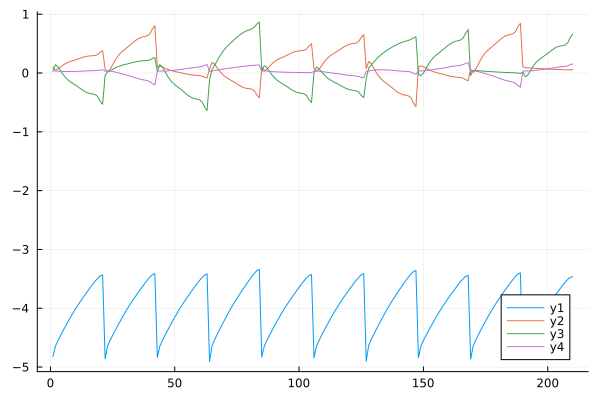

In [115]:
plt = plot()
for j in 1:nₘ
    plot!([ ũ_trb[i][j] for i in eachindex(ũ_trb) ])
end
plt

In [116]:
ΔL2_trb_online = [ L2(uₕₜ_trb[i]-uₕₜ[i]) / L2(uₕₜ[i]) for i in eachindex(uₕₜ_trb) ]
ΔH1_trb_online = [ H1(uₕₜ_trb[i]-uₕₜ[i]) / H1(uₕₜ[i]) for i in eachindex(uₕₜ_trb) ];

In [117]:
Statistics.mean(ΔL2_trb_online), Statistics.std(ΔL2_trb_online; corrected=false), maximum(ΔL2_trb_online)

(0.05407685904985793, 0.014630729624154813, 0.11974228390187154)

In [118]:
Statistics.mean(ΔH1_trb_online), Statistics.std(ΔH1_trb_online; corrected=false), maximum(ΔH1_trb_online)

(0.13086121456684416, 0.0315423588084361, 0.2946312278664612)

In [119]:
Statistics.mean(ΔL2_rb_online), Statistics.std(ΔL2_rb_online; corrected=false), maximum(ΔL2_rb_online)

(0.2598058512760253, 0.23021742247461133, 0.8452560871313265)

In [120]:
Statistics.mean(ΔH1_rb_online), Statistics.std(ΔH1_rb_online; corrected=false), maximum(ΔH1_rb_online)

(0.48361418634105957, 0.40362375152213814, 1.3819127855288351)

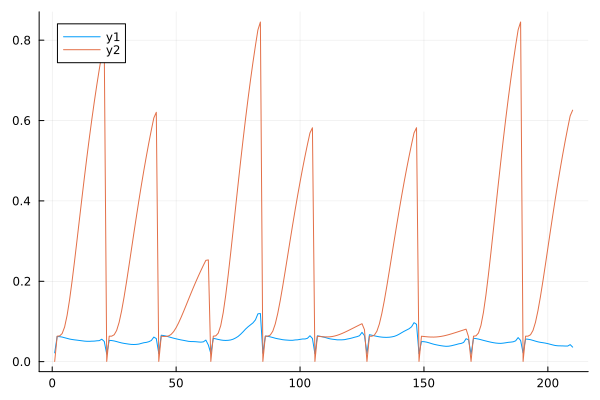

In [121]:
plot(ΔL2_trb_online)
plot!(ΔL2_rb_online)

In [122]:
(ω̄ₜ_samples)

10-element Vector{Any}:
 2.048172193278203
 3.449790032588226
 1.3734204579032128
 5.618709735484967
 2.218665895883152
 2.477179531823963
 5.988658654067139
 4.998568891921718
 3.105463501721357
 4.702430269195866

In [123]:
collect(range(0,2π,length=6))

6-element Vector{Float64}:
 0.0
 1.2566370614359172
 2.5132741228718345
 3.7699111843077517
 5.026548245743669
 6.283185307179586

In [124]:
M_ΔL2_rb = reshape(ΔL2_rb_online, :, nₒₜ)'
M_ΔL2_trb = reshape(ΔL2_trb_online, :, nₒₜ)';
M_ΔH1_rb = reshape(ΔH1_rb_online, :, nₒₜ)'
M_ΔH1_trb = reshape(ΔH1_trb_online, :, nₒₜ)';

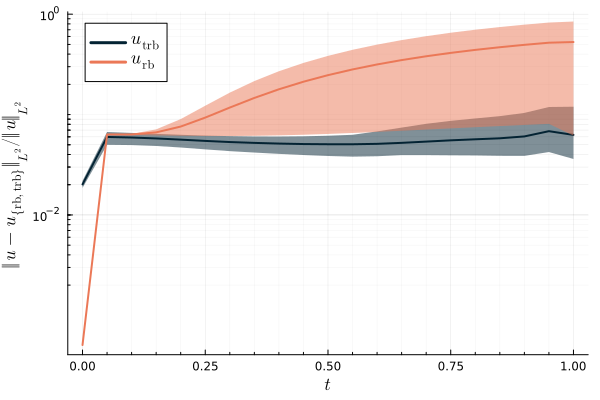

In [142]:
cpal = palette(:thermal, 4)
plot(t0:dt:tF, Statistics.mean(M_ΔL2_trb, dims = 1)', minorgrid = true, yaxis = :log,
    ribbon = ( Statistics.mean(M_ΔL2_trb, dims = 1)' - minimum(M_ΔL2_trb, dims = 1)',
                - Statistics.mean(M_ΔL2_trb, dims = 1)' + maximum(M_ΔL2_trb, dims = 1)'),
    linewidth = 2, color = cpal[1], label = L"u_{\mathrm{trb}}" )
plot!(t0:dt:tF, Statistics.mean(M_ΔL2_rb, dims = 1)',
    ribbon = ( Statistics.mean(M_ΔL2_rb, dims = 1)' - minimum(M_ΔL2_rb, dims = 1)',
               - Statistics.mean(M_ΔL2_rb, dims = 1)' + maximum(M_ΔL2_rb, dims = 1)'),
    linewidth = 2, color = cpal[3], xlabel = L"t", ylabel = L"\Vert u - u_{\{\mathrm{rb,trb}\}} \Vert_{L^2} / \Vert u \Vert_{L^2}" , 
    legend = :topleft, label = L"u_{\mathrm{rb}}",
    legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12
)
#savefig("../figs/L2err_nm=40_4_3_log.pdf")

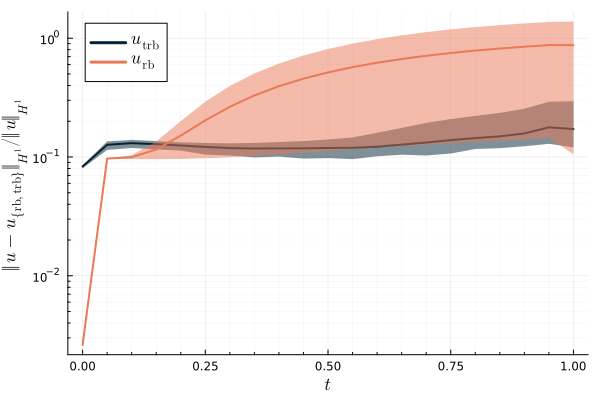

In [144]:
cpal = palette(:thermal, 4)
plot(t0:dt:tF, Statistics.mean(M_ΔH1_trb, dims = 1)', ribbonalpha = 0.5, minorgrid = true, yaxis = :log,
    ribbon = ( Statistics.mean(M_ΔH1_trb, dims = 1)' - minimum(M_ΔH1_trb, dims = 1)',
                - Statistics.mean(M_ΔH1_trb, dims = 1)' + maximum(M_ΔH1_trb, dims = 1)'),
    linewidth = 2, color = cpal[1], label = L"u_{\mathrm{trb}}" )
plot!(t0:dt:tF, Statistics.mean(M_ΔH1_rb, dims = 1)',
    ribbon = ( Statistics.mean(M_ΔH1_rb, dims = 1)' - minimum(M_ΔH1_rb, dims = 1)',
               - Statistics.mean(M_ΔH1_rb, dims = 1)' + maximum(M_ΔH1_rb, dims = 1)'),
    linewidth = 2, color = cpal[3], xlabel = L"t", ylabel = L"\Vert u - u_{\{\mathrm{rb,trb}\}} \Vert_{H^1} / \Vert u \Vert_{H^1}" , 
    legend = :topleft, label = L"u_{\mathrm{rb}}",
    legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12
)
#savefig("../figs/H1err_nm=40_4_3_log.pdf")

In [127]:
Statistics.mean(M_ΔL2_trb[:,end]), std(M_ΔL2_trb[:,end]), maximum(M_ΔL2_trb[:,end])

(0.06273045768175306, 0.025191300271549096, 0.11974228390187154)

In [128]:
Statistics.mean(M_ΔL2_rb[:,end]), std(M_ΔL2_rb[:,end]), maximum(M_ΔL2_rb[:,end])

(0.5278050728889452, 0.2951893975727598, 0.8452560871313265)

In [129]:
Statistics.mean(M_ΔH1_trb[:,end]), std(M_ΔH1_trb[:,end]), maximum(M_ΔH1_trb[:,end])

(0.1718883719256063, 0.05338221442196356, 0.2946312278664612)

In [130]:
Statistics.mean(M_ΔH1_rb[:,end]), std(M_ΔH1_rb[:,end]), maximum(M_ΔH1_rb[:,end])

(0.8740226257396305, 0.4821684793602471, 1.3819127855288351)

In [131]:
n, nₘ, m

(40, 4, 3)

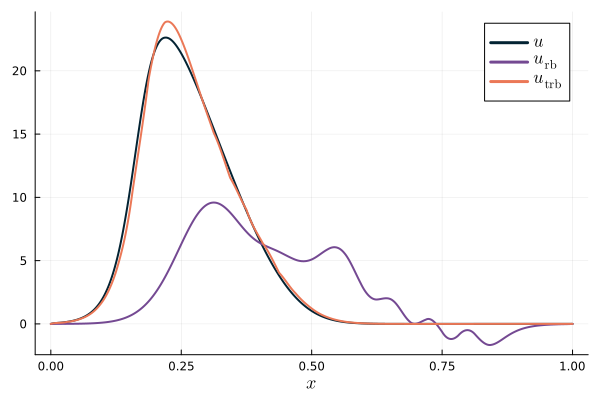

In [132]:
_i = argmax(ΔL2_rb_online) #rand(1:nₜ)
cpal = palette(:thermal, 3+1)
x_cord = 0:0.001:1
plot(x_cord, x -> uₕₜ[_i](Point([x,0.5])), label = L"u", xlabel = L"x",
linewidth = 2, color = cpal[1],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
plot!(x_cord, x -> uₕₜ_rb[_i](Point([x,0.5])), label = L"u_{\mathrm{rb}}",
linewidth = 2, color = cpal[2],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
plot!(x_cord, x -> uₕₜ_trb[_i](Point([x,0.5])), label = L"u_{\mathrm{trb}}",
linewidth = 2, color = cpal[3],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
#savefig("../figs/crosssec_x_n=1.pdf")

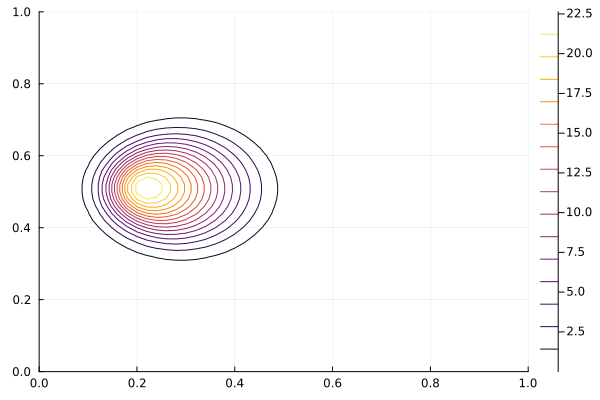

In [133]:
x_cord = 0:0.02:1
contour(x_cord,x_cord, (x,y) -> uₕₜ[_i](Point(x,y)))

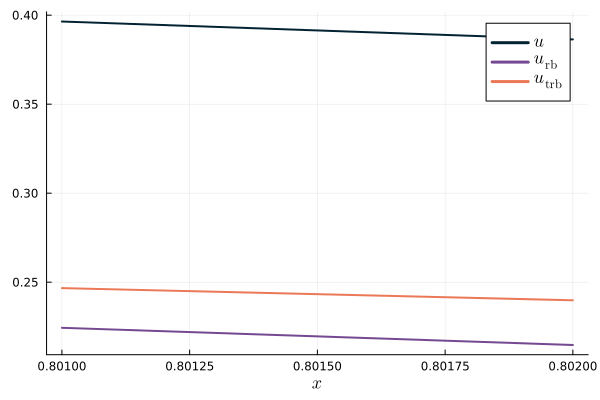

In [108]:
#_i = argmax(ΔL2_trb_online) #rand(1:nₜ)
cpal = palette(:thermal, 3+1)
x_cord = 0.801:0.001:0.802
plot(x_cord, x -> uₕₜ[_i](Point([0.5,x])), label = L"u", xlabel = L"x",
linewidth = 2, color = cpal[1],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
plot!(x_cord, x -> uₕₜ_rb[_i](Point([0.5,x])), label = L"u_{\mathrm{rb}}",
linewidth = 2, color = cpal[2],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
plot!(x_cord, x -> uₕₜ_trb[_i](Point([0.5,x])), label = L"u_{\mathrm{trb}}",
linewidth = 2, color = cpal[3],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
#savefig("../figs/crosssec_x_n=1.pdf")

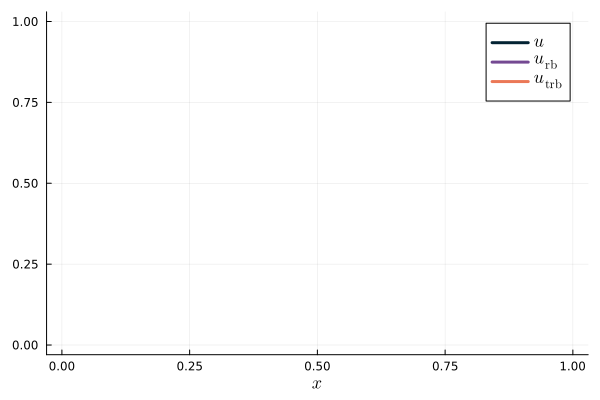

In [109]:
#_i = argmax(ΔL2_trb_online) #rand(1:nₜ)
cpal = palette(:thermal, 3+1)
x_cord = 0.8:0.001:0.75
plot(x_cord, x -> uₕₜ[_i](Point([x,0.75])), label = L"u", xlabel = L"x",
linewidth = 2, color = cpal[1],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
plot!(x_cord, x -> uₕₜ_rb[_i](Point([x,0.75])), label = L"u_{\mathrm{rb}}",
linewidth = 2, color = cpal[2],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
plot!(x_cord, x -> uₕₜ_trb[_i](Point([x,0.75])), label = L"u_{\mathrm{trb}}",
linewidth = 2, color = cpal[3],
legendfontsize=12, tickfontsize=8, xguidefontsize=12, yguidefontsize=12)
#savefig("../figs/crosssec_x_n=1.pdf")

In [110]:
1 - evdT.values[1] / sum(evdT.values)

0.024815354023415725

In [111]:
contour(x_cord,x_cord, (x,y) -> uₕₜ[1010](Point(x,y)) )

In [112]:
length(get_free_dof_values(uₕ[1]))

9025

In [113]:
nₛ

126

In [114]:
contour(x_cord,x_cord, (x,y) -> uₕₜ[end](Point(x,y)) )

In [115]:
contour(x_cord,x_cord, (x,y) -> uₕₜ_rb[end](Point(x,y)) )

In [116]:
contour(x_cord,x_cord, (x,y) -> uₕₜ_trb[end](Point(x,y)) )

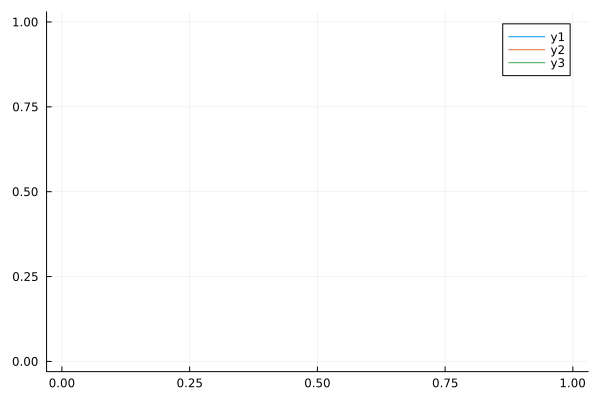

In [117]:
plot( x_cord, x -> uₕₜ[1](Point(x,0.5)) )
plot!( x_cord, x -> uₕₜ_rb[1](Point(x,0.5)) )
plot!( x_cord, x -> uₕₜ_trb[1](Point(x,0.5)) )

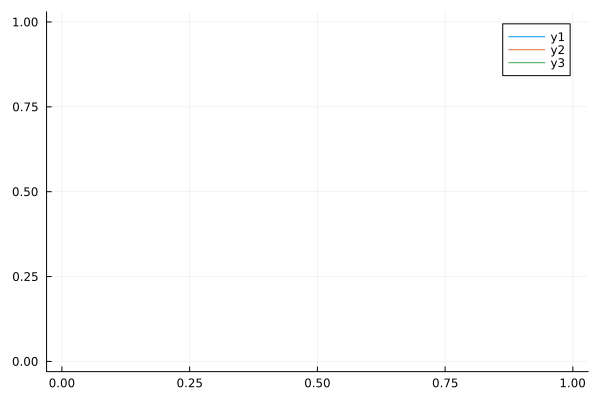

In [118]:
plot( x_cord, x -> uₕₜ[101](Point(x,0.5)) )
plot!( x_cord, x -> uₕₜ_rb[101](Point(x,0.5)) )
plot!( x_cord, x -> uₕₜ_trb[101](Point(x,0.5)) )